# Training Generative Adversarial Networks (GANs) in PyTorch

# Introduction to Generative Modeling

Deep neural networks are primarily utilized for supervised learning tasks such as classification or regression. However, Generative Adversarial Networks (GANs) employ neural networks for a distinct purpose known as generative modeling.

Generative modeling is an unsupervised learning task in machine learning. It involves automatically discovering and learning the regularities or patterns within input data. The goal is to develop a model capable of generating new examples that plausibly resemble samples drawn from the original dataset.

While various approaches exist for generative modeling, Generative Adversarial Networks follow the following approach:

<img src="https://i.imgur.com/6NMdO9u.png" style="width:420px; margin-bottom:32px"/>

This approach incorporates two neural networks: a *Generator* and a *Discriminator*. The generator generates a "fake" sample based on a random vector/matrix, while the discriminator endeavors to discern whether a given sample is "real" (drawn from the training data) or "fake" (produced by the generator). Training occurs in a coordinated manner: the discriminator is trained for a few epochs, followed by training the generator for a few epochs, and this process is repeated. As a result, both the generator and the discriminator improve their respective capabilities over time.

In [1]:
# Linux / Binder / Windows (No GPU)
# pip install numpy matplotlib torch==1.7.0+cpu torchvision==0.8.1+cpu torchaudio==0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

# Linux / Windows (GPU)
%pip install numpy matplotlib torch torchvision torchaudio -f https://download.pytorch.org/whl/torch_stable.html
 
# MacOS (NO GPU)
# !pip install numpy matplotlib torch torchvision torchaudio

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Note: you may need to restart the kernel to use updated packages.


The dataset has a single folder called `images` which contains all 63,000+ images in JPG format.

In [2]:
import os

DATA_DIR = './impressionism'
print(os.listdir(DATA_DIR))

['images']


In [3]:
print(os.listdir(DATA_DIR+'/images')[:10])

['a-y-jackson_a-copse-evening-1918.jpg', 'a-y-jackson_early-spring-quebec-1923.jpg', 'a-y-jackson_first-snow-algoma-country-1920.jpg', 'a-y-jackson_frozen-lake-early-spring-algonquin-park-1914.jpg', 'a-y-jackson_maple-woods-algoma-1920.jpg', 'a-y-jackson_march-storm-georgian-bay-1920.jpg', 'a-y-jackson_night-pine-island-1921.jpg', 'a-y-jackson_october-morning-algoma-wartz-lake-1920.jpg', 'a-y-jackson_terre-sauvage-1913.jpg', 'a-y-jackson_the-edge-of-the-maple-wood-1910.jpg']


To load this dataset, we will utilize the ImageFolder class from torchvision library. Additionally, we will resize and crop the images to a size of 64x64 pixels. Furthermore, we will normalize the pixel values by applying a mean and standard deviation of 0.5 for each color channel. This normalization process ensures that the pixel values fall within the range of (-1, 1), which is more suitable for training the discriminator. Lastly, we will create a data loader to load the data in batches for efficient processing.

In [4]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [5]:
image_size = 32
batch_size = 64
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [6]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

Helper functions to denormalize the image tensors and display some sample images from a training batch:

In [7]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [9]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        print(images.shape)
        break

torch.Size([64, 3, 32, 32])


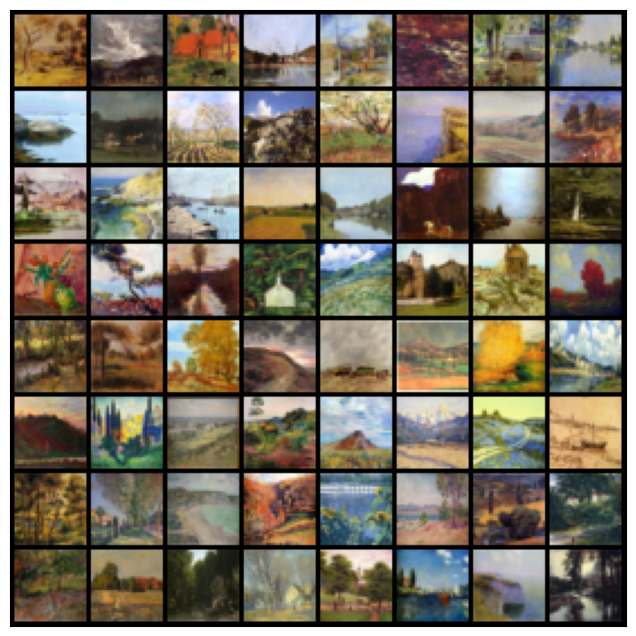

In [10]:
show_batch(train_dl)

## Using a GPU

Defining a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move our model & data to the GPU, if available.

In [11]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [12]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [13]:
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

![](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd.gif)

In [14]:
import torch.nn as nn

In [15]:
import torch.nn as nn

discriminator = nn.Sequential(
    # in: 3 x 32 x 32

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 16 x 16

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 8 x 8

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 4 x 4

    nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 1 x 1

    nn.Conv2d(512, 1, kernel_size=1, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)


We are using the Leaky ReLU activation for the discriminator.

<img src="https://cdn-images-1.medium.com/max/1600/1*ypsvQH7kvtI2BhzR2eT_Sw.png" width="420">


>  Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [16]:
discriminator = to_device(discriminator, device)

## Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 28 x 28`. To achive this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs to as a *transposed convolution* (also referred to as a *deconvolution*).

![](https://i.imgur.com/DRvK546.gif)

In [17]:
latent_size = 64

In [18]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh(),
    # out: 3 x 32 x 32
)

We apply the TanH activation function to the output layer of the generator. 

<img src="https://nic.schraudolph.org/teach/NNcourse/figs/tanh.gif" width="420" >

> This activation function is chosen specifically for the final layer to ensure that the generated outputs fall within the range of [-1, 1]. The TanH function has the property of saturating and covering the color space of the training distribution more quickly, allowing the model to learn effectively.

In contrast, the ReLU activation function is commonly used in the generator's hidden layers, except for the output layer. The ReLU function is unbounded and helps to introduce non-linearity and capture complex patterns in the data.

For the discriminator, the leaky rectified activation function has been found to work well, particularly for higher resolution modeling. This activation function addresses the issue of "dying ReLU" by introducing a small slope for negative inputs, which helps the discriminator model to better handle diverse and complex data.

It is important to note that as the TanH activation function produces outputs in the range of [-1, 1], the images in the training dataset have been transformed and normalized to have pixel values within this range. When generating outputs using the generator, we apply the reverse transformation and denormalization to obtain the output images in a viewable format.

torch.Size([64, 3, 32, 32])


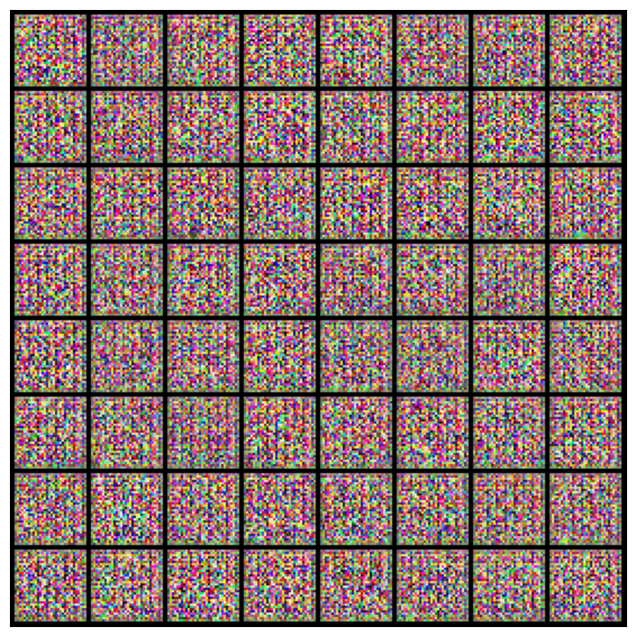

In [19]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet. 

Let's move the generator to the chosen device.

In [20]:
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="https://image.slidesharecdn.com/chrishokamp-dublinnlp3-160805110319/95/task-based-learning-for-nlp-going-beyond-cross-entropy-chris-hokamp-10-638.jpg?cb=1470395213" width="420" >

In [21]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

- We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network. 

- We first pass a batch of real images, and compute the loss, setting the target labels to 1. 

- Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0. 

- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator. 

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [22]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [23]:
from torchvision.utils import save_image

In [24]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [25]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [26]:
fixed_latent = torch.randn(32, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


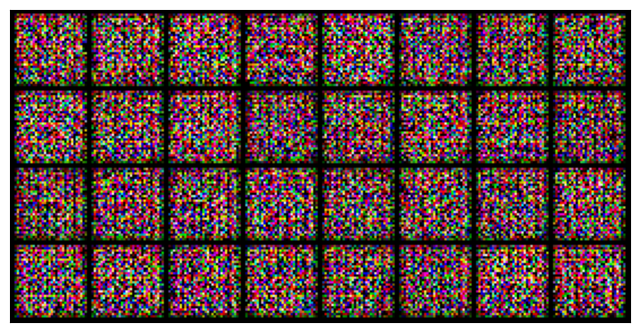

In [27]:
save_samples(0, fixed_latent)

## Full Training Loop

Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>



In [28]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [29]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [30]:
lr = 0.0002
epochs = 50

In [31]:
history = fit(epochs, lr, start_idx=50)

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [1/50], loss_g: 0.9216, loss_d: 1.3065, real_score: 0.4707, fake_score: 0.4086
Saving generated-images-0050.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [2/50], loss_g: 1.0853, loss_d: 1.3995, real_score: 0.4431, fake_score: 0.3622
Saving generated-images-0051.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [3/50], loss_g: 1.3409, loss_d: 2.1913, real_score: 0.4578, fake_score: 0.2856
Saving generated-images-0052.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [4/50], loss_g: 1.5415, loss_d: 1.8274, real_score: 0.3679, fake_score: 0.2307
Saving generated-images-0053.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [5/50], loss_g: 1.6529, loss_d: 1.3513, real_score: 0.3945, fake_score: 0.2000
Saving generated-images-0054.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [6/50], loss_g: 1.4727, loss_d: 1.2123, real_score: 0.5396, fake_score: 0.3141
Saving generated-images-0055.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [7/50], loss_g: 1.5560, loss_d: 1.3628, real_score: 0.4768, fake_score: 0.2936
Saving generated-images-0056.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [8/50], loss_g: 1.8268, loss_d: 1.6114, real_score: 0.4675, fake_score: 0.2272
Saving generated-images-0057.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [9/50], loss_g: 1.5575, loss_d: 1.1107, real_score: 0.5506, fake_score: 0.2438
Saving generated-images-0058.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [10/50], loss_g: 1.4504, loss_d: 1.8626, real_score: 0.4726, fake_score: 0.2371
Saving generated-images-0059.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [11/50], loss_g: 1.8704, loss_d: 0.6015, real_score: 0.6836, fake_score: 0.1646
Saving generated-images-0060.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [12/50], loss_g: 1.9808, loss_d: 0.3105, real_score: 0.8619, fake_score: 0.1461
Saving generated-images-0061.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [13/50], loss_g: 2.2128, loss_d: 0.3372, real_score: 0.8385, fake_score: 0.1085
Saving generated-images-0062.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [14/50], loss_g: 2.4608, loss_d: 0.2054, real_score: 0.8992, fake_score: 0.0894
Saving generated-images-0063.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [15/50], loss_g: 2.6583, loss_d: 0.2232, real_score: 0.8889, fake_score: 0.0744
Saving generated-images-0064.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [16/50], loss_g: 2.8257, loss_d: 0.1262, real_score: 0.9431, fake_score: 0.0650
Saving generated-images-0065.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [17/50], loss_g: 2.9527, loss_d: 0.2601, real_score: 0.8286, fake_score: 0.0519
Saving generated-images-0066.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [18/50], loss_g: 3.1375, loss_d: 0.1525, real_score: 0.9048, fake_score: 0.0441
Saving generated-images-0067.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [19/50], loss_g: 3.3899, loss_d: 0.1318, real_score: 0.9121, fake_score: 0.0342
Saving generated-images-0068.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [20/50], loss_g: 3.6546, loss_d: 0.0589, real_score: 0.9733, fake_score: 0.0312
Saving generated-images-0069.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [21/50], loss_g: 3.6608, loss_d: 0.3498, real_score: 0.7817, fake_score: 0.0259
Saving generated-images-0070.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [22/50], loss_g: 3.5334, loss_d: 0.0518, real_score: 0.9789, fake_score: 0.0298
Saving generated-images-0071.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [23/50], loss_g: 3.6911, loss_d: 0.0889, real_score: 0.9398, fake_score: 0.0242
Saving generated-images-0072.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [24/50], loss_g: 3.7598, loss_d: 0.0498, real_score: 0.9738, fake_score: 0.0228
Saving generated-images-0073.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [25/50], loss_g: 4.0355, loss_d: 0.0434, real_score: 0.9774, fake_score: 0.0199
Saving generated-images-0074.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [26/50], loss_g: 3.9809, loss_d: 0.2529, real_score: 0.8538, fake_score: 0.0185
Saving generated-images-0075.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [27/50], loss_g: 4.0129, loss_d: 0.3558, real_score: 0.8769, fake_score: 0.0183
Saving generated-images-0076.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [28/50], loss_g: 1.7461, loss_d: 1.1641, real_score: 0.6028, fake_score: 0.1950
Saving generated-images-0077.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [29/50], loss_g: 2.0076, loss_d: 1.4918, real_score: 0.5603, fake_score: 0.1449
Saving generated-images-0078.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [30/50], loss_g: 2.2785, loss_d: 0.6837, real_score: 0.6495, fake_score: 0.1118
Saving generated-images-0079.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [31/50], loss_g: 2.4446, loss_d: 0.6867, real_score: 0.5659, fake_score: 0.0809
Saving generated-images-0080.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [32/50], loss_g: 2.3177, loss_d: 0.5846, real_score: 0.6405, fake_score: 0.0935
Saving generated-images-0081.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [33/50], loss_g: 2.7060, loss_d: 1.1812, real_score: 0.5054, fake_score: 0.0786
Saving generated-images-0082.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [34/50], loss_g: 2.8780, loss_d: 1.6012, real_score: 0.3932, fake_score: 0.0618
Saving generated-images-0083.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [35/50], loss_g: 2.8988, loss_d: 1.4458, real_score: 0.4248, fake_score: 0.0721
Saving generated-images-0084.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [36/50], loss_g: 2.8030, loss_d: 0.9472, real_score: 0.5177, fake_score: 0.0829
Saving generated-images-0085.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [37/50], loss_g: 3.1177, loss_d: 1.7010, real_score: 0.3987, fake_score: 0.0450
Saving generated-images-0086.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [38/50], loss_g: 3.4126, loss_d: 2.1778, real_score: 0.3623, fake_score: 0.0425
Saving generated-images-0087.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [39/50], loss_g: 2.9438, loss_d: 0.7096, real_score: 0.5853, fake_score: 0.0501
Saving generated-images-0088.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [40/50], loss_g: 3.1729, loss_d: 1.2247, real_score: 0.4993, fake_score: 0.0474
Saving generated-images-0089.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [41/50], loss_g: 3.4677, loss_d: 0.4274, real_score: 0.6916, fake_score: 0.0325
Saving generated-images-0090.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [42/50], loss_g: 3.4318, loss_d: 3.3647, real_score: 0.4072, fake_score: 0.0300
Saving generated-images-0091.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [43/50], loss_g: 2.9540, loss_d: 0.7311, real_score: 0.5762, fake_score: 0.0524
Saving generated-images-0092.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [44/50], loss_g: 3.3160, loss_d: 0.4417, real_score: 0.6998, fake_score: 0.0381
Saving generated-images-0093.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [45/50], loss_g: 3.5130, loss_d: 0.6318, real_score: 0.6638, fake_score: 0.0353
Saving generated-images-0094.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [46/50], loss_g: 3.5890, loss_d: 0.6564, real_score: 0.6105, fake_score: 0.0466
Saving generated-images-0095.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [47/50], loss_g: 3.7500, loss_d: 0.7356, real_score: 0.6415, fake_score: 0.0227
Saving generated-images-0096.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [48/50], loss_g: 3.6840, loss_d: 1.1939, real_score: 0.4306, fake_score: 0.0428
Saving generated-images-0097.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [49/50], loss_g: 8.4346, loss_d: 1.0782, real_score: 0.5577, fake_score: 0.2063
Saving generated-images-0098.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [50/50], loss_g: 3.3022, loss_d: 3.8962, real_score: 0.3842, fake_score: 0.0405
Saving generated-images-0099.png


In [32]:
losses_g, losses_d, real_scores, fake_scores = history

Now that we have trained the models, we can save checkpoints.

In [33]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Exporting the model:

In [34]:
%pip install onnx

noise = torch.randn(1, latent_size, 1, 1)
noise = noise.to(device)

input_names = ["input_noise"]
output_names = ["generated_image"]
onnx_path = "generator_32X32.onnx"
dummy_input = noise
torch.onnx.export(generator, dummy_input, onnx_path, input_names=input_names, output_names=output_names)

Note: you may need to restart the kernel to use updated packages.


============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



Here's how the generated images look after some epochs of training:

In [35]:
from IPython.display import Image

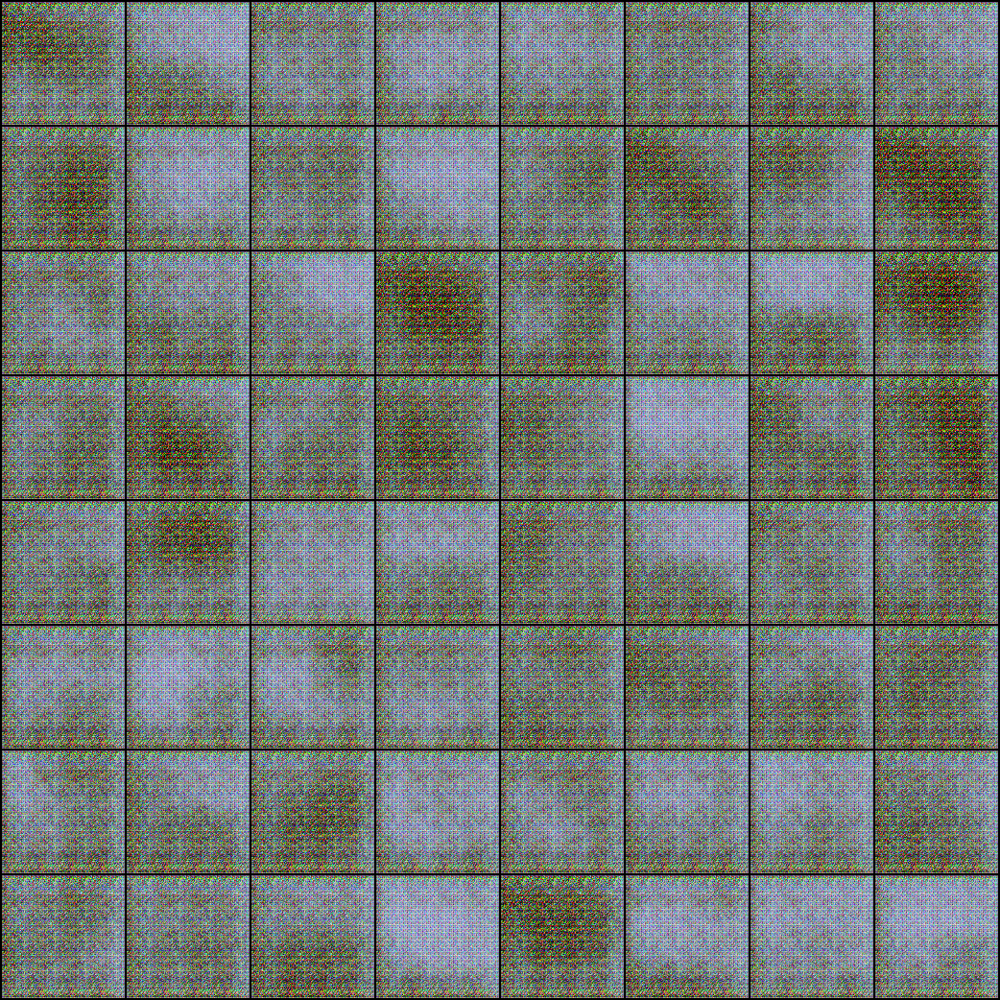

In [36]:
Image('./generated/generated-images-0001.png')

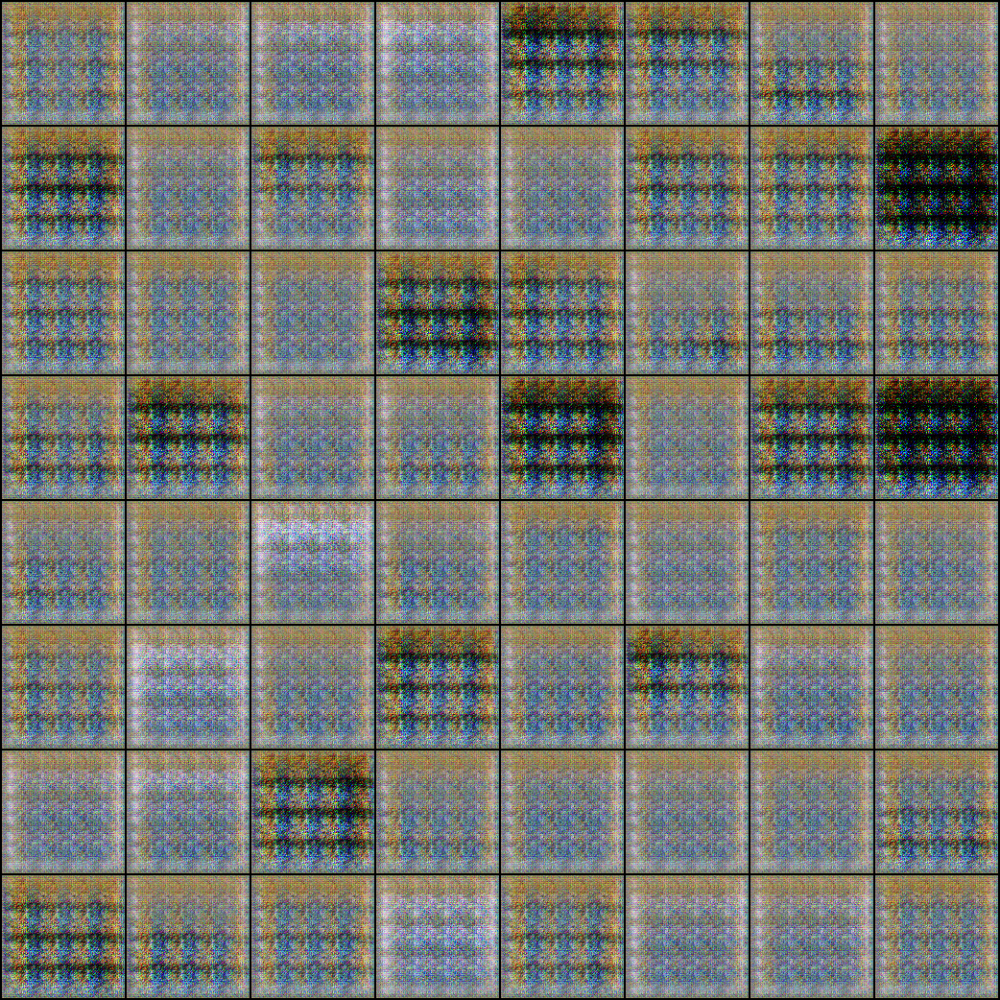

In [37]:
Image('./generated/generated-images-0010.png')

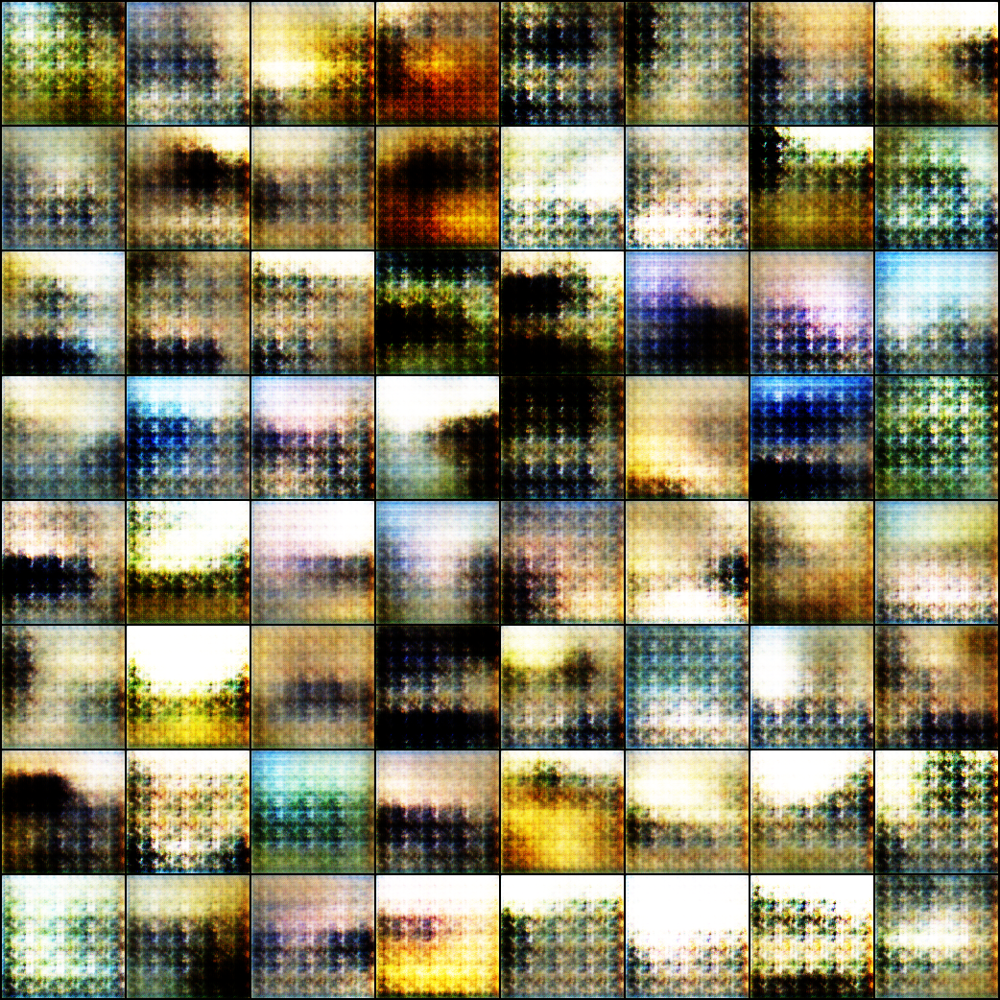

In [38]:
Image('./generated/generated-images-0020.png')

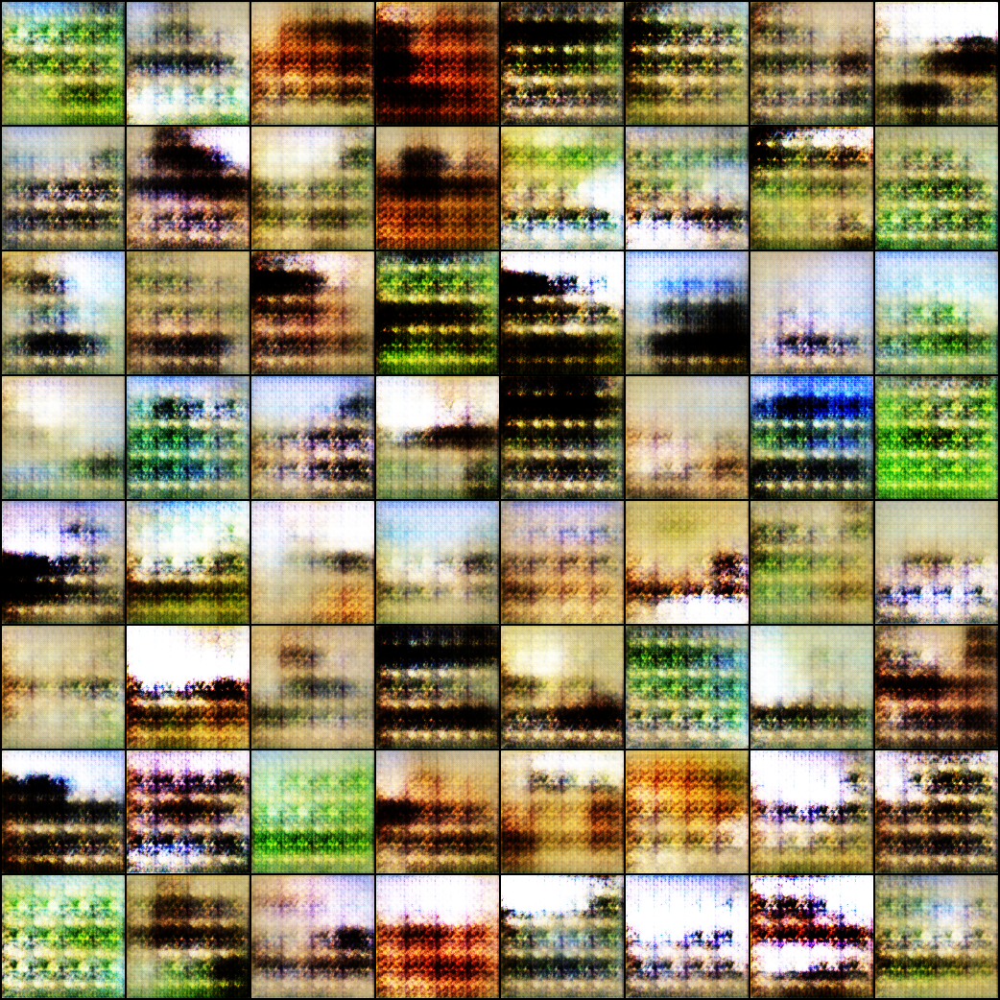

In [39]:
Image('./generated/generated-images-0025.png')

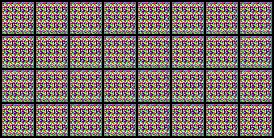

In [40]:
Image('./generated/generated-images-0050.png')

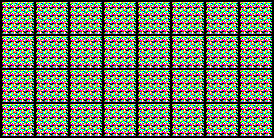

In [41]:
Image('./generated/generated-images-0070.png')

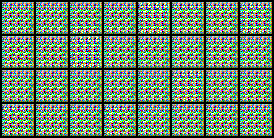

In [42]:
Image('./generated/generated-images-0090.png')

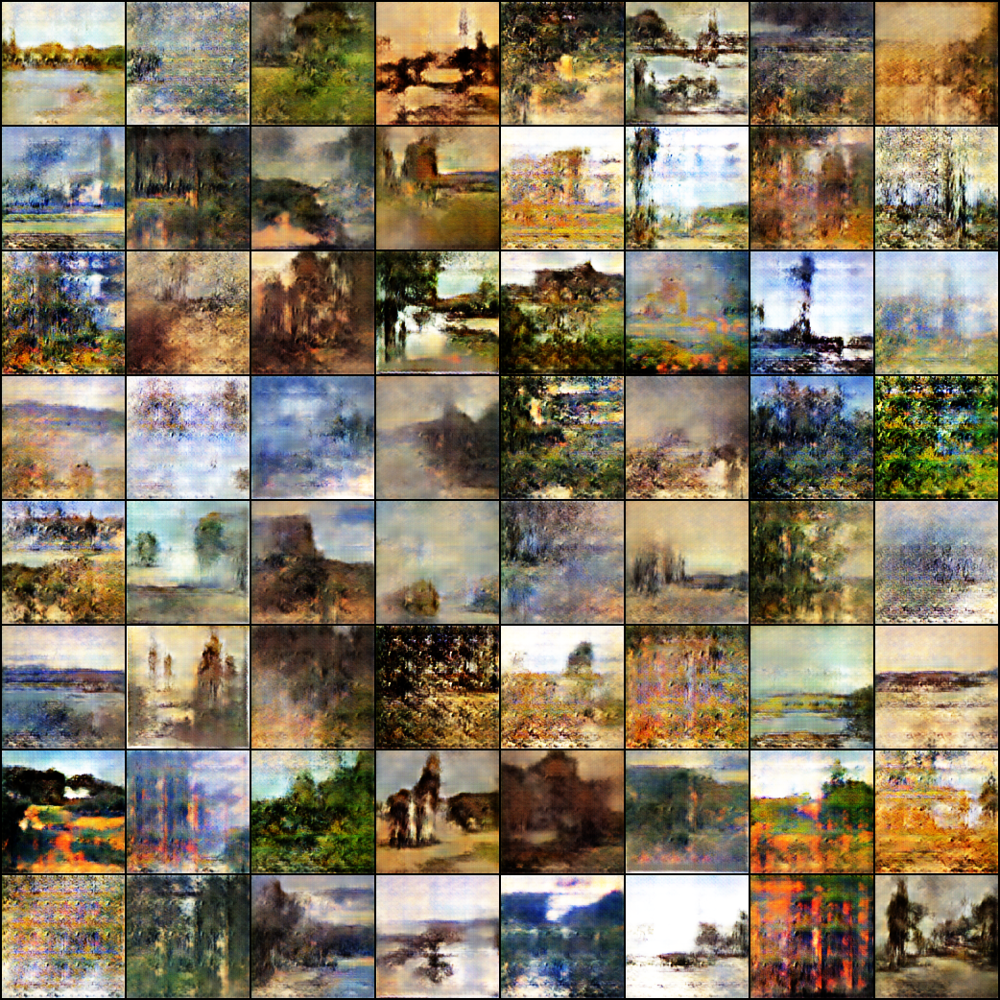

In [43]:
Image('./generated/generated-images-0100.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [44]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

Here's what it looks like:

![]()


We can also visualize how the loss changes over time. Visualizing 
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.



Text(0.5, 1.0, 'Losses')

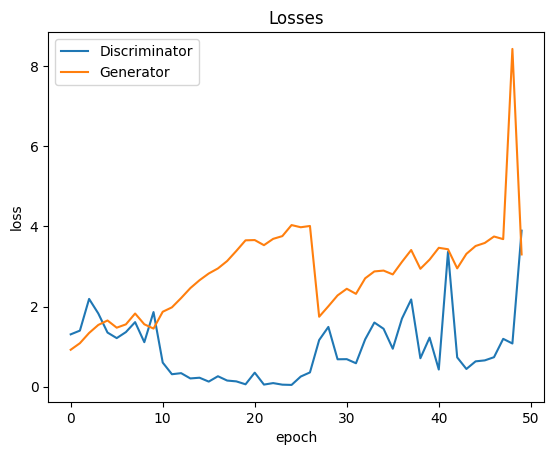

In [45]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')

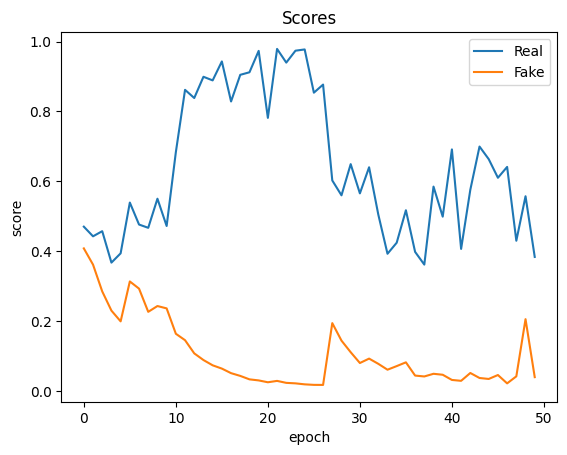

In [46]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

* Quantization in int8 or uint8

In [47]:
import onnx

from onnx_tf.backend import prepare

onnx_model = onnx.load("input_path")  # load onnx model
tf_rep = prepare(onnx_model)  # prepare tf representation
tf_rep.export_graph("output_path")  # export the model

c:\Users\matti\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


FileNotFoundError: [Errno 2] No such file or directory: 'input_path'

In [ ]:
%pip install tensorflow-gpu==1.15.0
%pip install toco

# Convert
# toco --saved_model_dir generator_64x64.pb --graph_def_file generator_64x64pb/saved_model.pb --output_file generator_64x64.tflite --output_format TFLITE --inference_type FLOAT --inference_input_type FLOAT --input_arrays input --output_arrays output


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement tensorflow-gpu==1.15.0 (from versions: 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.12.0)
ERROR: No matching distribution found for tensorflow-gpu==1.15.0


  Using cached toco-0.0.9-py3-none-any.whl (8.4 kB)
Note: you may need to restart the kernel to use updated packages.


UsageError: Line magic function `%toco` not found.


In [ ]:
# import onnxsim
# import onnx

# simplified_onnx_model, success = onnxsim.simplify("generator_64x64.onnx")
# assert success, 'Failed to simplify the ONNX model. You may have to skip this step'
# simplified_onnx_model_path =  f'generator_64x64.simplified.onnx'

# print(f'Generating {simplified_onnx_model_path} ...')
# onnx.save(simplified_onnx_model, simplified_onnx_model_path)
# print('done')

In [ ]:
# import sys
# import os

# # Import the model optimizer tool from the openvino_dev package
# from openvino.tools.mo import main as mo_main
# import onnx
# from onnx_tf.backend import prepare
# from mltk.utils.shell_cmd import run_shell_cmd

# # Load the ONNX model
# onnx_model = onnx.load(ONNX_MODEL_PATH)
# tf_rep = prepare(onnx_model)

# # Get the input tensor shape
# input_tensor = tf_rep.signatures[tf_rep.inputs[0]]
# input_shape = input_tensor.shape
# input_shape_str = '[' + ','.join([str(x) for x in input_shape]) + ']'


# openvino_out_dir = f'{WORKING_DIR}/openvino'
# os.makedirs(openvino_out_dir, exist_ok=True)


# print(f'Generating openvino at: {openvino_out_dir}')
# cmd = [ 
#     sys.executable, mo_main.__file__, 
#     '--input_model', simplified_onnx_model_path,
#     '--input_shape', input_shape_str,
#     '--output_dir', openvino_out_dir,
#     '--data_type', 'FP32'

# ]
# retcode, retmsg = run_shell_cmd(cmd,  outfile=sys.stdout)
# assert retcode == 0, 'Failed to do conversion' 

In [ ]:
# import os 
# from mltk.utils.shell_cmd import run_shell_cmd

# openvino2tensorflow_out_dir = f'./openvino2tensorflow'
# openvino_xml_name = os.path.basename(simplified_onnx_model_path)[:-len('.onnx')] + '.xml'


# if os.name == 'nt':
#   openvino2tensorflow_exe_cmd = [sys.executable, os.path.join(os.path.dirname(sys.executable), 'openvino2tensorflow')]
# else:
#   openvino2tensorflow_exe_cmd = ['openvino2tensorflow']

# print(f'Generating openvino2tensorflow model at: {openvino2tensorflow_out_dir} ...')
# cmd = openvino2tensorflow_exe_cmd + [ 
#     '--model_path', f'{openvino_out_dir}/{openvino_xml_name}',
#     '--model_output_path', openvino2tensorflow_out_dir,
#     '--output_saved_model',
#     '--output_no_quant_float32_tflite'
# ]

# retcode, retmsg = run_shell_cmd(cmd)
# assert retcode == 0, retmsg
# print('done')

KeyboardInterrupt: 

* Quantize

In [ ]:
# import tensorflow as tf 

# tflite_int8_model_path = f'generator_64x64.int8.tflite'

# converter = tf.lite.TFLiteConverter.from_saved_model(openvino2tensorflow_out_dir)

# def representative_dataset():
#     for i, sample in enumerate(x_test):
#         yield [np.expand_dims(sample, axis=0)]
#         if i >= 1000: # We only need a small portion of the dataset to do the quantization 
#             break

# converter.optimizations = [tf.lite.Optimize.DEFAULT]
# converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8] # We only want to use int8 kernels
# converter.inference_input_type = tf.float32 # Can also be tf.int8
# converter.inference_output_type = tf.float32  # Can also be tf.int8
# converter.representative_dataset = representative_dataset

# print(f'Generating {tflite_int8_model_path} ...')
# tflite_quant_model = converter.convert()

# with open(tflite_int8_model_path, 'wb') as f:
#     f.write(tflite_quant_model)

# print('done')